In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('seaborn-bright')
%matplotlib inline
import seaborn as sns
import plotly.express as px
from datetime import datetime

In [ ]:
df = pd.read_csv('/content/crime.csv')

In [ ]:
df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,10224738,HY411648,09/05/2015 01:30:00,043XX S WOOD ST,0486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,False,True,...,12.0,61.0,08B,1165074.0,1875917.0,2015,02/10/2018 03:50:01 PM,41.815117,-87.670000,"(41.815117282, -87.669999562)"
1,10224739,HY411615,09/04/2015 11:30:00,008XX N CENTRAL AVE,0870,THEFT,POCKET-PICKING,CTA BUS,False,False,...,29.0,25.0,06,1138875.0,1904869.0,2015,02/10/2018 03:50:01 PM,41.895080,-87.765400,"(41.895080471, -87.765400451)"
2,11646166,JC213529,09/01/2018 12:01:00,082XX S INGLESIDE AVE,0810,THEFT,OVER $500,RESIDENCE,False,True,...,8.0,44.0,06,NaN,NaN,2018,04/06/2019 04:04:43 PM,NaN,NaN,NaN
3,10224740,HY411595,09/05/2015 12:45:00,035XX W BARRY AVE,2023,NARCOTICS,POSS: HEROIN(BRN/TAN),SIDEWALK,True,False,...,35.0,21.0,18,1152037.0,1920384.0,2015,02/10/2018 03:50:01 PM,41.937406,-87.716650,"(41.937405765, -87.716649687)"
4,10224741,HY411610,09/05/2015 01:00:00,0000X N LARAMIE AVE,0560,ASSAULT,SIMPLE,APARTMENT,False,True,...,28.0,25.0,08A,1141706.0,1900086.0,2015,02/10/2018 03:50:01 PM,41.881903,-87.755121,"(41.881903443, -87.755121152)"


In [ ]:
df = df.applymap(lambda s: s.lower() if type(s) == str else s)

In [ ]:
df.drop(['X Coordinate', 'Y Coordinate', 'Location'], axis=1, inplace=True)

In [ ]:
df.rename(columns = {'Case Number':'Vaka Numarası', 'Date':'Tarih-Saat',
                     'Block':'Adres', 'IUCR':'Suç Kodu',
                     'Primary Type':'Suç', 'Description':'Suç Açıklaması',
                     'Location Description':'Olay Yeri', 'Arrest':'Tutuklama',
                     'Domestic':'Yerel', 'Ward':'Belediye Bölgesi',
                     'Community Area':'Topluluk Alanı', 'FBI Code':'FBI Suç Kodu',
                     'Year':'Yıl', 'Updated On':'Güncelleme Tarihi',
                     'Latitude':'Enlem', 'Longitude':'Boylam',
                     'District':'Polis Bölgesi'}, inplace = True)

In [ ]:
df.shape

(108268, 19)

In [ ]:
df.head(2)

,ID,Vaka Numarası,Tarih-Saat,Adres,Suç Kodu,Suç,Suç Açıklaması,Olay Yeri,Tutuklama,Yerel,Beat,Polis Bölgesi,Belediye Bölgesi,Topluluk Alanı,FBI Suç Kodu,Yıl,Güncelleme Tarihi,Enlem,Boylam
0,10224738,hy411648,09/05/2015 01:30:00,043xx s wood st,0486,battery,domestic battery simple,residence,False,True,924,9.0,12.0,61.0,08b,2015,02/10/2018 03:50:01 pm,41.815117,-87.6700
1,10224739,hy411615,09/04/2015 11:30:00,008xx n central ave,0870,theft,pocket-picking,cta bus,False,False,1511,15.0,29.0,25.0,06,2015,02/10/2018 03:50:01 pm,41.895080,-87.7654


In [ ]:
df.dtypes

ID                     int64
Vaka Numarası         object
Tarih-Saat            object
Adres                 object
Suç Kodu              object
Suç                   object
Suç Açıklaması        object
Olay Yeri             object
Tutuklama               bool
Yerel                   bool
Beat                   int64
Polis Bölgesi        float64
Belediye Bölgesi     float64
Topluluk Alanı       float64
FBI Suç Kodu          object
Yıl                    int64
Güncelleme Tarihi     object
Enlem                float64
Boylam               float64
dtype: object

In [ ]:
df['Tarih-Saat'] = pd.to_datetime(df['Tarih-Saat'])

In [ ]:
df['Tarih'] = pd.to_datetime([datetime.date(d) for d in df['Tarih-Saat']])

In [ ]:
df['Ay'] = df['Tarih'].dt.month

In [ ]:
df.head(2)

,ID,Vaka Numarası,Tarih-Saat,Adres,Suç Kodu,Suç,Suç Açıklaması,Olay Yeri,Tutuklama,Yerel,...,Polis Bölgesi,Belediye Bölgesi,Topluluk Alanı,FBI Suç Kodu,Yıl,Güncelleme Tarihi,Enlem,Boylam,Tarih,Ay
0,10224738,hy411648,2015-09-05 01:30:00,043xx s wood st,0486,battery,domestic battery simple,residence,False,True,...,9.0,12.0,61.0,08b,2015,02/10/2018 03:50:01 pm,41.815117,-87.6700,2015-09-05,9
1,10224739,hy411615,2015-09-04 11:30:00,008xx n central ave,0870,theft,pocket-picking,cta bus,False,False,...,15.0,29.0,25.0,06,2015,02/10/2018 03:50:01 pm,41.895080,-87.7654,2015-09-04,9


In [ ]:
df['Suç Açıklaması'].unique()

array(['domestic battery simple', 'pocket-picking', 'over $500',
       'poss: heroin(brn/tan)', 'simple', 'forcible entry',
       'unlawful entry', 'retail theft', 'strongarm - no weapon',
       'financial identity theft over $ 300', '$500 and under',
       'telephone threat',
       'aggravated domestic battery: other dang weapon', 'to vehicle',
       'to property', 'armed: handgun', 'from building',
       'aggravated: other dang weapon', 'harassment by telephone',
       'other vehicle offense', 'parole violation',
       'poss: cannabis 30gms or less', 'unlawful use other dang weapon',
       'poss firearm/ammo:no foid card', 'counterfeit check',
       'manu/deliver: heroin (white)', 'unlawful poss other firearm',
       'unlawful use handgun', 'to land', 'automobile',
       'harassment by electronic means', 'fraud or confidence game',
       'poss: crack', 'aggravated:knife/cutting instr', 'attempt theft',
       'solicit narcotics on publicway', 'poss: heroin(white)',
    

In [ ]:
df['Suç Açıklaması'].nunique()

322

In [ ]:
df['Suç Açıklaması'].replace({'agg crim sex abuse fam member': 'aggravated criminal sexual abuse by family member', 
                           'agg criminal sexual abuse': 'aggravated criminal sexual abuse',
                           'agg. domestic battery - hands, fists, feet, serious injury': 'aggravated domestic battery: hands/fist/feet serious injury',
                           'aggravated - handgun': 'aggravated: handgun',
                           'aggravated po: handgun': 'aggravated police officer - handgun',
                           'agg po hands no/min injury': 'aggravated police officer - hands, fists, feet, no injury',
                           'aggravated - knife / cutting instrument': 'aggravated: knife/cut instr',
                           'aggravated - other': 'aggravated: other',
                           'aggravated - other dangerous weapon': 'aggravated: other dang weapon',
                           'armed - other dangerous weapon': 'armed: other dangerous weapon',
                           'attempt armed - handgun': 'attempt: armed-handgun',
                           'attempt armed - knife / cutting instrument': 'attempt: armed-knife/cut instr',
                           'false / stolen / altered trp': 'false/stolen/altered trp',
                           'finan exploit-elderly/disabled': 'financial exploitation of an elderly or disabled person',
                           'manu/del:cannabis 10gm or less': 'manufacture / deliver - cannabis 10 grams or less',
                           'manu/del:cannabis over 10 gms': 'manufacture / deliver - cannabis over 10 grams',
                           'manu/deliver: heroin (white)': 'manufacture / deliver -  heroin (white)',
                           'manu/deliver:cocaine': 'manufacture / deliver - cocaine',
                           'manu/deliver:crack': 'manufacture / deliver - crack',
                           'poss: cannabis more than 30gms': 'possess - cannabis more than 30 grams',
                           'poss: cocaine': 'possess - cocaine',
                           'poss: crack': 'possess - crack',
                           'poss: heroin(white)': 'possess - heroin (white)',
                           'resist / obstruct / disarm officer': 'resist/obstruct/disarm officer',
                           'strongarm - no weapon': 'strong arm - no weapon',
                           'theft / recovery - automobile': 'theft/recovery: automobile',
                           'theft of labor / services': 'theft of labor/services',
                           'to state sup prop': 'to state supported property',
                           'unlawful poss ammunition': 'unlawful possession - ammunition',
                           'unlawful poss of handgun': 'unlawful possession - handgun',
                           'vehicle title/reg offense': 'vehicle title / registration offense'}, inplace=True)

In [ ]:
df['Suç Açıklaması'].nunique()

291

In [ ]:
df['Olay Yeri'].unique()

array(['residence', 'cta bus', 'sidewalk', 'apartment',
       'residence-garage', 'grocery food store', 'street', nan,
       'parking lot/garage(non.resid.)', 'small retail store', 'other',
       'vehicle non-commercial', 'restaurant', 'residence porch/hallway',
       'alley', 'library', 'athletic club', 'drug store', 'park property',
       'cha parking lot/grounds', 'nursing home/retirement home',
       'driveway - residential', 'residential yard (front/back)',
       'commercial / business office', 'department store', 'hotel/motel',
       'gas station', 'bar or tavern',
       'church/synagogue/place of worship', 'sports arena/stadium',
       'construction site', 'hospital building/grounds', 'cta station',
       'tavern/liquor store', 'cha hallway/stairwell/elevator',
       'convenience store', 'warehouse', 'vacant lot/land',
       'cta bus stop', 'cha apartment', 'taxicab', 'cta train',
       'appliance store', 'barbershop', 'bank', 'school, public, grounds',
       'fac

In [ ]:
df['Olay Yeri'].nunique()

118

In [ ]:
df['Olay Yeri'].replace({'cha hallway/stairwell/elevator': 'cha hallway / stairwell / elevator', 
                           'cha parking lot/grounds': 'cha parking lot / grounds',
                           'factory/manufacturing building': 'factory / manufacturing building',
                           'hospital building/grounds': 'hospital building / grounds',
                           'movie house/theater': 'movie house / theater',
                           'parking lot/garage(non.resid.)': 'parking lot / garage (non residential)',
                           'police facility/veh parking lot': 'police facility / vehicle parking lot',
                           'residence-garage': 'residence - garage',
                           'residence porch/hallway': 'residence - porch / hallway',
                           'residential yard (front/back)': 'residence - yard (front / back)',
                           'school, public, building': 'school - public building',
                           'vacant lot/land': 'vacant lot / land',
                           'vehicle - other ride share service (e.g., uber, lyft)': 'vehicle - other ride share service (lyft, uber, etc.)'}, inplace=True)

In [ ]:
df['Olay Yeri'].nunique()

105

In [ ]:
df.isnull().sum()

ID                      0
Vaka Numarası           0
Tarih-Saat              0
Adres                   0
Suç Kodu                0
Suç                     0
Suç Açıklaması          0
Olay Yeri             248
Tutuklama               0
Yerel                   0
Beat                    0
Polis Bölgesi           0
Belediye Bölgesi        0
Topluluk Alanı          0
FBI Suç Kodu            0
Yıl                     0
Güncelleme Tarihi       0
Enlem                2149
Boylam               2149
Tarih                   0
Ay                      0
dtype: int64

In [ ]:
df.shape

(108268, 21)

In [ ]:
2149/108268

0.019848893486533417

In [ ]:
df = df.dropna()

In [ ]:
df.isnull().sum()

ID                   0
Vaka Numarası        0
Tarih-Saat           0
Adres                0
Suç Kodu             0
Suç                  0
Suç Açıklaması       0
Olay Yeri            0
Tutuklama            0
Yerel                0
Beat                 0
Polis Bölgesi        0
Belediye Bölgesi     0
Topluluk Alanı       0
FBI Suç Kodu         0
Yıl                  0
Güncelleme Tarihi    0
Enlem                0
Boylam               0
Tarih                0
Ay                   0
dtype: int64

In [ ]:
df.shape

(106074, 21)

In [ ]:
df.head(3)

,ID,Vaka Numarası,Tarih-Saat,Adres,Suç Kodu,Suç,Suç Açıklaması,Olay Yeri,Tutuklama,Yerel,...,Polis Bölgesi,Belediye Bölgesi,Topluluk Alanı,FBI Suç Kodu,Yıl,Güncelleme Tarihi,Enlem,Boylam,Tarih,Ay
0,10224738,hy411648,2015-09-05 01:30:00,043xx s wood st,0486,battery,domestic battery simple,residence,False,True,...,9.0,12.0,61.0,08b,2015,02/10/2018 03:50:01 pm,41.815117,-87.67000,2015-09-05,9
1,10224739,hy411615,2015-09-04 11:30:00,008xx n central ave,0870,theft,pocket-picking,cta bus,False,False,...,15.0,29.0,25.0,06,2015,02/10/2018 03:50:01 pm,41.895080,-87.76540,2015-09-04,9
3,10224740,hy411595,2015-09-05 12:45:00,035xx w barry ave,2023,narcotics,poss: heroin(brn/tan),sidewalk,True,False,...,14.0,35.0,21.0,18,2015,02/10/2018 03:50:01 pm,41.937406,-87.71665,2015-09-05,9


In [ ]:
df.Adres.value_counts

<bound method IndexOpsMixin.value_counts of 0               043xx s wood st
1           008xx n central ave
3             035xx w barry ave
4           0000x n laramie ave
5           082xx s loomis blvd
                  ...          
108262      100xx s western ave
108263        079xx s essex ave
108264       075xx s rhodes ave
108265    030xx e cheltenham pl
108266     079xx s michigan ave
Name: Adres, Length: 106074, dtype: object>

In [ ]:
df['Sokak-Cadde'] = df['Adres'].str[8:]

In [ ]:
df

,ID,Vaka Numarası,Tarih-Saat,Adres,Suç Kodu,Suç,Suç Açıklaması,Olay Yeri,Tutuklama,Yerel,...,Belediye Bölgesi,Topluluk Alanı,FBI Suç Kodu,Yıl,Güncelleme Tarihi,Enlem,Boylam,Tarih,Ay,Sokak-Cadde
0,10224738,hy411648,2015-09-05 01:30:00,043xx s wood st,0486,battery,domestic battery simple,residence,False,True,...,12.0,61.0,08b,2015,02/10/2018 03:50:01 pm,41.815117,-87.670000,2015-09-05,9,wood st
1,10224739,hy411615,2015-09-04 11:30:00,008xx n central ave,0870,theft,pocket-picking,cta bus,False,False,...,29.0,25.0,06,2015,02/10/2018 03:50:01 pm,41.895080,-87.765400,2015-09-04,9,central ave
3,10224740,hy411595,2015-09-05 12:45:00,035xx w barry ave,2023,narcotics,poss: heroin(brn/tan),sidewalk,True,False,...,35.0,21.0,18,2015,02/10/2018 03:50:01 pm,41.937406,-87.716650,2015-09-05,9,barry ave
4,10224741,hy411610,2015-09-05 01:00:00,0000x n laramie ave,0560,assault,simple,apartment,False,True,...,28.0,25.0,08a,2015,02/10/2018 03:50:01 pm,41.881903,-87.755121,2015-09-05,9,laramie ave
5,10224742,hy411435,2015-09-05 10:55:00,082xx s loomis blvd,0610,burglary,forcible entry,residence,False,False,...,21.0,71.0,05,2015,02/10/2018 03:50:01 pm,41.744379,-87.658431,2015-09-05,9,loomis blvd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108262,10336311,hy527662,2015-12-07 01:59:00,100xx s western ave,0620,burglary,unlawful entry,credit union,False,False,...,19.0,72.0,05,2015,12/14/2015 04:15:12 pm,41.711181,-87.681764,2015-12-07,12,western ave
108263,10336312,hy527691,2015-12-07 04:01:00,079xx s essex ave,0820,theft,$500 and under,apartment,False,False,...,7.0,46.0,06,2015,02/10/2018 03:50:01 pm,41.751281,-87.563801,2015-12-07,12,essex ave
108264,10336313,hy527663,2015-12-07 02:00:00,075xx s rhodes ave,0486,battery,domestic battery simple,apartment,False,False,...,6.0,69.0,08b,2015,12/14/2015 04:15:12 pm,41.757496,-87.611442,2015-12-07,12,rhodes ave
108265,10336315,hy527678,2015-12-07 03:00:00,030xx e cheltenham pl,1320,criminal damage,to vehicle,street,False,True,...,7.0,46.0,14,2015,02/10/2018 03:50:01 pm,41.753103,-87.550271,2015-12-07,12,cheltenham pl


In [ ]:
df.to_csv(r'C:\Users\Sinem\Desktop\crime-dataset-cleaned.csv', index=False)

In [ ]:
import plotly.express as px
fig=px.histogram(df,x='Suç').update_xaxes(categoryorder='total descending')
fig.show()

In [ ]:
df.head(2)

,ID,Vaka Numarası,Tarih-Saat,Adres,Suç Kodu,Suç,Suç Açıklaması,Olay Yeri,Tutuklama,Yerel,...,Belediye Bölgesi,Topluluk Alanı,FBI Suç Kodu,Yıl,Güncelleme Tarihi,Enlem,Boylam,Tarih,Ay,Sokak-Cadde
0,10224738,hy411648,2015-09-05 01:30:00,043xx s wood st,0486,battery,domestic battery simple,residence,False,True,...,12.0,61.0,08b,2015,02/10/2018 03:50:01 pm,41.815117,-87.6700,2015-09-05,9,wood st
1,10224739,hy411615,2015-09-04 11:30:00,008xx n central ave,0870,theft,pocket-picking,cta bus,False,False,...,29.0,25.0,06,2015,02/10/2018 03:50:01 pm,41.895080,-87.7654,2015-09-04,9,central ave


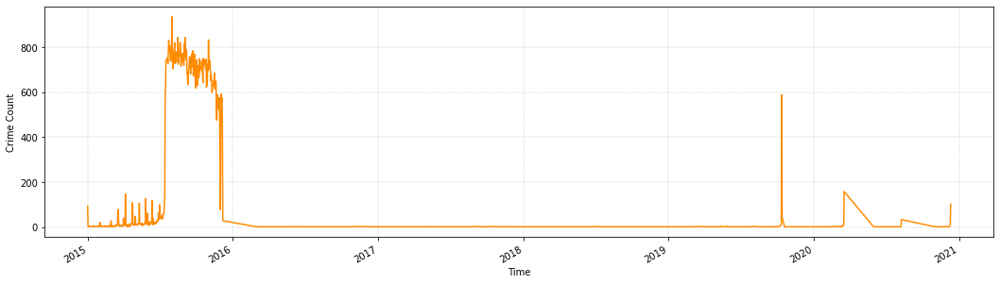

In [ ]:
df.groupby(df['Tarih'])['ID'].count().plot(kind='line', color='darkorange', figsize=(18, 5), legend=None)
plt.xlabel('Time')
plt.ylabel('Crime Count')
plt.grid(color='grey', linestyle=':', linewidth=0.4)

plt.show()

In [ ]:
df.groupby('Suç')['Tutuklama'].agg('mean').sort_values(ascending=False)
# suça göre tutuklanma oranları

Suç
gambling                             1.000000
public indecency                     1.000000
prostitution                         1.000000
concealed carry license violation    1.000000
homicide                             1.000000
narcotics                            0.999512
liquor law violation                 0.991667
interference with public officer     0.956443
weapons violation                    0.786572
public peace violation               0.767568
obscenity                            0.764706
criminal trespass                    0.663004
other narcotic violation             0.500000
non - criminal                       0.285714
other offense                        0.276291
sex offense                          0.261538
assault                              0.232067
battery                              0.229532
stalking                             0.200000
human trafficking                    0.166667
offense involving children           0.164604
non-criminal                  

In [ ]:
df.columns

Index(['ID', 'Vaka Numarası', 'Tarih-Saat', 'Adres', 'Suç Kodu', 'Suç',
       'Suç Açıklaması', 'Olay Yeri', 'Tutuklama', 'Yerel', 'Beat',
       'Polis Bölgesi', 'Belediye Bölgesi', 'Topluluk Alanı', 'FBI Suç Kodu',
       'Yıl', 'Güncelleme Tarihi', 'Enlem', 'Boylam', 'Tarih', 'Ay',
       'Sokak-Cadde'],
      dtype='object')

In [ ]:
fig=px.histogram(df,x='Polis Bölgesi',title='Polis Bölgesi Sayısı')
fig.show()

In [ ]:
df['Polis Bölgesi'].unique()

array([ 9., 15., 14.,  6., 10., 12.,  8., 16.,  5.,  2.,  4., 22.,  3.,
        1.,  7., 11., 17., 20., 25., 18., 19., 24., 31.])

In [ ]:
df.head()

,ID,Vaka Numarası,Tarih-Saat,Adres,Suç Kodu,Suç,Suç Açıklaması,Olay Yeri,Tutuklama,Yerel,...,Belediye Bölgesi,Topluluk Alanı,FBI Suç Kodu,Yıl,Güncelleme Tarihi,Enlem,Boylam,Tarih,Ay,Sokak-Cadde
0,10224738,hy411648,2015-09-05 01:30:00,043xx s wood st,0486,battery,domestic battery simple,residence,False,True,...,12.0,61.0,08b,2015,02/10/2018 03:50:01 pm,41.815117,-87.670000,2015-09-05,9,wood st
1,10224739,hy411615,2015-09-04 11:30:00,008xx n central ave,0870,theft,pocket-picking,cta bus,False,False,...,29.0,25.0,06,2015,02/10/2018 03:50:01 pm,41.895080,-87.765400,2015-09-04,9,central ave
3,10224740,hy411595,2015-09-05 12:45:00,035xx w barry ave,2023,narcotics,poss: heroin(brn/tan),sidewalk,True,False,...,35.0,21.0,18,2015,02/10/2018 03:50:01 pm,41.937406,-87.716650,2015-09-05,9,barry ave
4,10224741,hy411610,2015-09-05 01:00:00,0000x n laramie ave,0560,assault,simple,apartment,False,True,...,28.0,25.0,08a,2015,02/10/2018 03:50:01 pm,41.881903,-87.755121,2015-09-05,9,laramie ave
5,10224742,hy411435,2015-09-05 10:55:00,082xx s loomis blvd,0610,burglary,forcible entry,residence,False,False,...,21.0,71.0,05,2015,02/10/2018 03:50:01 pm,41.744379,-87.658431,2015-09-05,9,loomis blvd


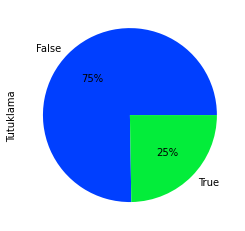

In [ ]:
df['Tutuklama'].value_counts().plot(kind='pie', autopct='%1.0f%%')

In [ ]:
df.groupby('Yıl')['Tutuklama'].agg(['mean'])
# yıla göre tutuklanma oranları 

,mean
Yıl,
2015,0.248331
2016,0.000000
2017,0.038462
2018,0.187500
2019,0.192157
2020,0.153639


In [ ]:
fig=px.pie(df,values='Beat',names='Suç',title='Beate göre suç tipi ')
fig.show()

In [ ]:
fig=px.scatter(df,x='Yıl',y='Beat',color='Tutuklama')
fig.show()

In [ ]:
fig=px.scatter(df,x='Yıl',y='Beat',color='Suç')
fig.show()

In [ ]:
from sklearn.preprocessing import LabelEncoder

le=LabelEncoder()
df['Tutuklama']=le.fit_transform(df['Tutuklama'])
df

,ID,Vaka Numarası,Tarih-Saat,Adres,Suç Kodu,Suç,Suç Açıklaması,Olay Yeri,Tutuklama,Yerel,...,Belediye Bölgesi,Topluluk Alanı,FBI Suç Kodu,Yıl,Güncelleme Tarihi,Enlem,Boylam,Tarih,Ay,Sokak-Cadde
0,10224738,hy411648,2015-09-05 01:30:00,043xx s wood st,0486,battery,domestic battery simple,residence,0,True,...,12.0,61.0,08b,2015,02/10/2018 03:50:01 pm,41.815117,-87.670000,2015-09-05,9,wood st
1,10224739,hy411615,2015-09-04 11:30:00,008xx n central ave,0870,theft,pocket-picking,cta bus,0,False,...,29.0,25.0,06,2015,02/10/2018 03:50:01 pm,41.895080,-87.765400,2015-09-04,9,central ave
3,10224740,hy411595,2015-09-05 12:45:00,035xx w barry ave,2023,narcotics,poss: heroin(brn/tan),sidewalk,1,False,...,35.0,21.0,18,2015,02/10/2018 03:50:01 pm,41.937406,-87.716650,2015-09-05,9,barry ave
4,10224741,hy411610,2015-09-05 01:00:00,0000x n laramie ave,0560,assault,simple,apartment,0,True,...,28.0,25.0,08a,2015,02/10/2018 03:50:01 pm,41.881903,-87.755121,2015-09-05,9,laramie ave
5,10224742,hy411435,2015-09-05 10:55:00,082xx s loomis blvd,0610,burglary,forcible entry,residence,0,False,...,21.0,71.0,05,2015,02/10/2018 03:50:01 pm,41.744379,-87.658431,2015-09-05,9,loomis blvd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108262,10336311,hy527662,2015-12-07 01:59:00,100xx s western ave,0620,burglary,unlawful entry,credit union,0,False,...,19.0,72.0,05,2015,12/14/2015 04:15:12 pm,41.711181,-87.681764,2015-12-07,12,western ave
108263,10336312,hy527691,2015-12-07 04:01:00,079xx s essex ave,0820,theft,$500 and under,apartment,0,False,...,7.0,46.0,06,2015,02/10/2018 03:50:01 pm,41.751281,-87.563801,2015-12-07,12,essex ave
108264,10336313,hy527663,2015-12-07 02:00:00,075xx s rhodes ave,0486,battery,domestic battery simple,apartment,0,False,...,6.0,69.0,08b,2015,12/14/2015 04:15:12 pm,41.757496,-87.611442,2015-12-07,12,rhodes ave
108265,10336315,hy527678,2015-12-07 03:00:00,030xx e cheltenham pl,1320,criminal damage,to vehicle,street,0,True,...,7.0,46.0,14,2015,02/10/2018 03:50:01 pm,41.753103,-87.550271,2015-12-07,12,cheltenham pl


In [ ]:
fig=px.imshow(df.corr(),text_auto=True)
fig.show()

In [ ]:
df['Suç'].nunique()

33

In [ ]:
fig=px.histogram(df,x='Suç')
fig.show()

In [ ]:
fig=px.imshow(df.corr(),text_auto=True)
fig.show()

In [ ]:
df['Adres'] = pd.factorize(df['Adres'])[0]
df['Suç Kodu'] = pd.factorize(df['Suç Kodu'])[0]
df['Suç Açıklaması'] = pd.factorize(df['Suç Açıklaması'])[0]
df['Olay Yeri'] = pd.factorize(df['Olay Yeri'])[0]
df['FBI Suç Kodu'] = pd.factorize(df['FBI Suç Kodu'])[0]

In [ ]:
df

,ID,Vaka Numarası,Tarih-Saat,Adres,Suç Kodu,Suç,Suç Açıklaması,Olay Yeri,Tutuklama,Yerel,...,Belediye Bölgesi,Topluluk Alanı,FBI Suç Kodu,Yıl,Güncelleme Tarihi,Enlem,Boylam,Tarih,Ay,Sokak-Cadde
0,10224738,hy411648,2015-09-05 01:30:00,0,0,battery,0,0,0,True,...,12.0,61.0,0,2015,02/10/2018 03:50:01 pm,41.815117,-87.670000,2015-09-05,9,wood st
1,10224739,hy411615,2015-09-04 11:30:00,1,1,theft,1,1,0,False,...,29.0,25.0,1,2015,02/10/2018 03:50:01 pm,41.895080,-87.765400,2015-09-04,9,central ave
3,10224740,hy411595,2015-09-05 12:45:00,2,2,narcotics,2,2,1,False,...,35.0,21.0,2,2015,02/10/2018 03:50:01 pm,41.937406,-87.716650,2015-09-05,9,barry ave
4,10224741,hy411610,2015-09-05 01:00:00,3,3,assault,3,3,0,True,...,28.0,25.0,3,2015,02/10/2018 03:50:01 pm,41.881903,-87.755121,2015-09-05,9,laramie ave
5,10224742,hy411435,2015-09-05 10:55:00,4,4,burglary,4,0,0,False,...,21.0,71.0,4,2015,02/10/2018 03:50:01 pm,41.744379,-87.658431,2015-09-05,9,loomis blvd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108262,10336311,hy527662,2015-12-07 01:59:00,9498,5,burglary,5,86,0,False,...,19.0,72.0,4,2015,12/14/2015 04:15:12 pm,41.711181,-87.681764,2015-12-07,12,western ave
108263,10336312,hy527691,2015-12-07 04:01:00,1489,8,theft,8,3,0,False,...,7.0,46.0,1,2015,02/10/2018 03:50:01 pm,41.751281,-87.563801,2015-12-07,12,essex ave
108264,10336313,hy527663,2015-12-07 02:00:00,16827,0,battery,0,3,0,False,...,6.0,69.0,0,2015,12/14/2015 04:15:12 pm,41.757496,-87.611442,2015-12-07,12,rhodes ave
108265,10336315,hy527678,2015-12-07 03:00:00,6459,13,criminal damage,12,6,0,True,...,7.0,46.0,8,2015,02/10/2018 03:50:01 pm,41.753103,-87.550271,2015-12-07,12,cheltenham pl


In [ ]:
fig=px.imshow(df.corr(),text_auto=True)
fig.show()

In [ ]:
from sklearn.model_selection import train_test_split # model bölümü
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,mean_squared_error # metrikler
from sklearn.cluster import KMeans # algoritma gözetimsiz
from xgboost import XGBClassifier # en iyi çalışan ağaç algoritmalarından biri

In [ ]:
df['Enlem'].value_counts()

41.883500    190
41.754593    151
41.742710    115
41.897895     93
41.909664     92
            ... 
41.908454      1
41.975227      1
42.002125      1
41.806398      1
41.750495      1
Name: Enlem, Length: 68321, dtype: int64

In [ ]:
df['Boylam'].value_counts()

-87.627877    190
-87.741529    151
-87.634088    115
-87.624097     93
-87.742729     92
             ... 
-87.696099      1
-87.613861      1
-87.609008      1
-87.614652      1
-87.621368      1
Name: Boylam, Length: 68310, dtype: int64

In [ ]:
geoloc_df=df.iloc[:,17:19]

In [ ]:
from sklearn.cluster import KMeans
kmeans=KMeans(n_clusters=5)
k_fit=kmeans.fit(geoloc_df)
k_fit.n_clusters # 3 tane merkez olacak

5

In [ ]:
k_fit.cluster_centers_ # küme merkezleri burada verildi 

array([[ 41.90197328, -87.74430511],
       [ 41.74090999, -87.60487611],
       [ 41.77808489, -87.68294149],
       [ 41.96533253, -87.67937305],
       [ 41.87564367, -87.64788399]])

In [ ]:
k_fit.labels_ [0:20]

array([2, 0, 0, 0, 2, 3, 4, 0, 2, 0, 1, 1, 4, 2, 0, 1, 2, 0, 1, 0],
      dtype=int32)

In [ ]:
kumeler=k_fit.labels_
kumeler

array([2, 0, 0, ..., 1, 1, 1], dtype=int32)

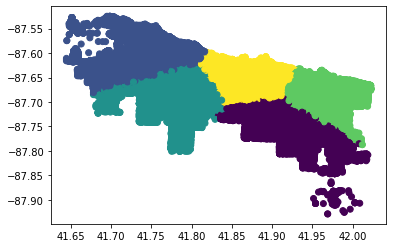

In [ ]:
plt.scatter(geoloc_df.iloc[:,0],geoloc_df.iloc[:,1],c=kumeler,cmap='viridis') # c centers

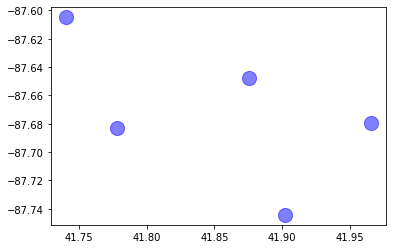

In [ ]:
merkezler= k_fit.cluster_centers_
plt.scatter(merkezler[:,0],merkezler[:,1],c='blue',s=200,alpha=0.5)

In [ ]:
merkezler

array([[ 41.90197328, -87.74430511],
       [ 41.74090999, -87.60487611],
       [ 41.77808489, -87.68294149],
       [ 41.96533253, -87.67937305],
       [ 41.87564367, -87.64788399]])

In [ ]:
wcss=[]
for i in range(1,11):
  kmeans=KMeans(n_clusters=i,init='k-means++',max_iter=300,n_init=10,random_state=10)
  kmeans.fit(geoloc_df)
  wcss.append(kmeans.inertia_)



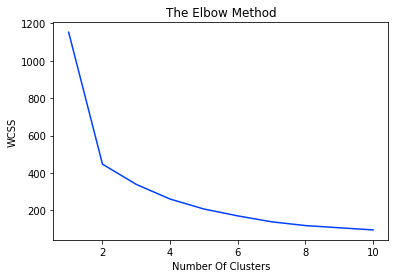

In [ ]:
plt.plot(range(1,11),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number Of Clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
df['Küme No']=kumeler
df

,ID,Vaka Numarası,Tarih-Saat,Adres,Suç Kodu,Suç,Suç Açıklaması,Olay Yeri,Tutuklama,Yerel,...,Topluluk Alanı,FBI Suç Kodu,Yıl,Güncelleme Tarihi,Enlem,Boylam,Tarih,Ay,Sokak-Cadde,Küme No
0,10224738,hy411648,2015-09-05 01:30:00,0,0,battery,0,0,0,True,...,61.0,0,2015,02/10/2018 03:50:01 pm,41.815117,-87.670000,2015-09-05,9,wood st,2
1,10224739,hy411615,2015-09-04 11:30:00,1,1,theft,1,1,0,False,...,25.0,1,2015,02/10/2018 03:50:01 pm,41.895080,-87.765400,2015-09-04,9,central ave,0
3,10224740,hy411595,2015-09-05 12:45:00,2,2,narcotics,2,2,1,False,...,21.0,2,2015,02/10/2018 03:50:01 pm,41.937406,-87.716650,2015-09-05,9,barry ave,0
4,10224741,hy411610,2015-09-05 01:00:00,3,3,assault,3,3,0,True,...,25.0,3,2015,02/10/2018 03:50:01 pm,41.881903,-87.755121,2015-09-05,9,laramie ave,0
5,10224742,hy411435,2015-09-05 10:55:00,4,4,burglary,4,0,0,False,...,71.0,4,2015,02/10/2018 03:50:01 pm,41.744379,-87.658431,2015-09-05,9,loomis blvd,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108262,10336311,hy527662,2015-12-07 01:59:00,9498,5,burglary,5,86,0,False,...,72.0,4,2015,12/14/2015 04:15:12 pm,41.711181,-87.681764,2015-12-07,12,western ave,2
108263,10336312,hy527691,2015-12-07 04:01:00,1489,8,theft,8,3,0,False,...,46.0,1,2015,02/10/2018 03:50:01 pm,41.751281,-87.563801,2015-12-07,12,essex ave,1
108264,10336313,hy527663,2015-12-07 02:00:00,16827,0,battery,0,3,0,False,...,69.0,0,2015,12/14/2015 04:15:12 pm,41.757496,-87.611442,2015-12-07,12,rhodes ave,1
108265,10336315,hy527678,2015-12-07 03:00:00,6459,13,criminal damage,12,6,0,True,...,46.0,8,2015,02/10/2018 03:50:01 pm,41.753103,-87.550271,2015-12-07,12,cheltenham pl,1


In [ ]:
result=pd.DataFrame({'Suç Tipleri':df['Suç'],'Küme Numaraları':kumeler,'Enlem':df['Enlem'],'Boylam':df['Boylam']})

In [ ]:
result.head()

,Suç Tipleri,Küme Numaraları,Enlem,Boylam
0,battery,2,41.815117,-87.670000
1,theft,0,41.895080,-87.765400
3,narcotics,0,41.937406,-87.716650
4,assault,0,41.881903,-87.755121
5,burglary,2,41.744379,-87.658431


In [ ]:
import plotly.express as px

fig=px.scatter(result,x='Enlem',y='Boylam',color='Küme Numaraları',title='Haritadaki Konumlara Göre İşlenebilecek Suçların Küme Grupları',width=1300 )
fig.show()

In [ ]:
fig=px.scatter(df,x='Küme No',y='Suç',color='Suç',title='Küme Numarasına Göre Suç Çeşitlerinin Dağılımı')
fig.show()

In [ ]:
# My works may be u can use these arguments for projects 

In [ ]:
df.columns

Index(['ID', 'Vaka Numarası', 'Tarih-Saat', 'Adres', 'Suç Kodu', 'Suç',
       'Suç Açıklaması', 'Olay Yeri', 'Tutuklama', 'Yerel', 'Beat',
       'Polis Bölgesi', 'Belediye Bölgesi', 'Topluluk Alanı', 'FBI Suç Kodu',
       'Yıl', 'Güncelleme Tarihi', 'Enlem', 'Boylam', 'Tarih', 'Ay',
       'Sokak-Cadde', 'Küme No'],
      dtype='object')

In [ ]:
df['Olay Yeri'].value_counts()
# this 4 places are important residence / apartment / street 

6      24435
0      16142
3      13579
2      12132
9       4130
       ...  
77         4
102        3
84         3
97         1
94         1
Name: Olay Yeri, Length: 103, dtype: int64

In [ ]:
fig=px.histogram(df,x='Olay Yeri')
fig.show()

In [ ]:
df['Olay Yeri'].nunique()

103

In [ ]:
df['Adres'].value_counts()[0:60]
# en çok olay çıkan suç raporu edilen caddeler 

698     309
809     181
701     156
129     151
1185    125
3194    123
1339    119
114      94
1980     93
820      85
691      83
1460     81
759      81
509      80
517      79
1218     77
2024     77
2432     75
1965     75
1369     75
330      72
1156     71
84       70
229      70
5269     68
3648     64
4060     64
256      63
183      62
3755     60
1527     59
2398     59
1441     59
1705     58
1853     58
562      58
1766     58
780      57
250      57
1308     56
733      55
433      55
1011     54
246      54
309      54
201      53
2029     53
3071     53
230      52
123      52
3449     51
5866     50
502      50
1399     50
2943     50
4168     50
1934     50
635      49
4431     49
2070     49
Name: Adres, dtype: int64

In [ ]:
df.groupby('Adres')['Tutuklama'].agg('mean') 
# en çok tutuklanma oranına sahip sokaklar çok doğru bir metrik değil

Adres
0        0.076923
1        0.000000
2        0.250000
3        0.600000
4        0.000000
           ...   
22484    0.000000
22485    0.000000
22486    0.000000
22487    0.000000
22488    0.000000
Name: Tutuklama, Length: 22489, dtype: float64

In [ ]:
fig=px.histogram(df,x='Adres',color='Yerel')
fig.show()

In [ ]:
df.groupby('Yıl')['Tutuklama'].agg(['min','max','mean'])
# seneler geçtikçe suç oranında bariz bir  göz önünde 2016 

,min,max,mean
Yıl,,,
2015,0,1,0.248331
2016,0,0,0.000000
2017,0,1,0.038462
2018,0,1,0.187500
2019,0,1,0.192157
2020,0,1,0.153639


In [ ]:
df[(df['Tutuklama']==0) & (df['Yıl']==2016)]['Tutuklama'].value_counts() # bunu sor   

0    22
Name: Tutuklama, dtype: int64

In [ ]:
df.groupby('Yerel')[['Topluluk Alanı','Tutuklama']].agg(['mean'])
# 

,Topluluk Alanı,Tutuklama
,mean,mean
Yerel,,
False,36.693928,0.256399
True,41.101082,0.199474


In [ ]:
df.groupby('Suç')['Tutuklama'].agg('mean')
# suçlara göre ortalama tutuklanma oranları

Suç
arson                                0.123153
assault                              0.232067
battery                              0.229532
burglary                             0.054325
concealed carry license violation    1.000000
crim sexual assault                  0.109689
criminal damage                      0.059196
criminal sexual assault              0.076923
criminal trespass                    0.663004
deceptive practice                   0.071717
gambling                             1.000000
homicide                             1.000000
human trafficking                    0.166667
interference with public officer     0.956443
intimidation                         0.100000
kidnapping                           0.082353
liquor law violation                 0.991667
motor vehicle theft                  0.093491
narcotics                            0.999512
non - criminal                       0.285714
non-criminal                         0.142857
obscenity                     